# Library

In [34]:
import pandas as pd
import numpy as np
import PreProcessingText as ppt
from collections import Counter, defaultdict
import seaborn as sns
from wordcloud import WordCloud
import networkx as nx
import matplotlib.pyplot as plt
import squarify
from transformers import pipeline
from tqdm import tqdm
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer, util
from bertopic.representation import MaximalMarginalRelevance, KeyBERTInspired
from sklearn.feature_extraction.text import CountVectorizer
from keybert import KeyBERT
from umap import UMAP
import hdbscan
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import csv
from bertopic.vectorizers import ClassTfidfTransformer
from sklearn.cluster import KMeans
from scipy.spatial import distance
from scipy.cluster import hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from matplotlib.colors import ListedColormap

## 4° Approach: BERTopic

In [2]:
df = pd.read_csv('cleaned_data_name_thread.csv')
df = df.dropna(subset=['name_thread'])
df = df.drop_duplicates(subset=['name_thread'], keep='first')
df.shape[0]

66735

In [3]:
model = SentenceTransformer('distiluse-base-multilingual-cased-v1')
tc1 = ppt.TextClustering(df, 'name_thread')
tc1.encode_corpus(model, batch_size=64, to_tensor=False)

2024-06-25 23:26:00,022 - PreProcessingText - INFO - Encoding the corpus. This might take a while.
Batches: 100%|██████████| 1024/1024 [36:18<00:00,  2.13s/it] 


array([[-0.03709169, -0.05162634, -0.00214579, ...,  0.02270307,
        -0.05459786,  0.01950254],
       [ 0.03408412, -0.02091261, -0.01459497, ..., -0.04562112,
        -0.03715435, -0.03791544],
       [-0.01364704,  0.02586178, -0.04539394, ..., -0.05560961,
        -0.00621877, -0.04389958],
       ...,
       [ 0.02015783, -0.02378834, -0.06152988, ..., -0.01399301,
         0.04657289,  0.01652681],
       [ 0.00111241,  0.06525975, -0.04557221, ..., -0.02572598,
        -0.00169028, -0.00972575],
       [ 0.02362325, -0.07427251, -0.01821832, ..., -0.01690697,
        -0.01522153, -0.02885605]], dtype=float32)

In [4]:
len(tc1.corpus), len(tc1.corpus_embeddings)

(65529, 65529)

In [5]:
seed_topic_list = [[
    'tor site', 'drug', 'cocaine', 'ketamine', 'weed', 'trafficking', 'scammer', 'market', 'vendor', 'bitcoin',
    'mdma', 'coke', 'lsd', 'heroine', 'xanax', 'tor node', 'tor site', 'gun', 'weapon', 'hacking'
]]

zeroshot_topic_list = [pd.read_csv('../../../intent_crime.csv')['intent'].tolist()]

representation_model = MaximalMarginalRelevance(diversity=0.3)
vectorizer_model = CountVectorizer(stop_words="english")
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
umap_model = UMAP(n_neighbors=15, n_components=10, min_dist=0.0, metric='cosine', random_state=42)
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=1200, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

topic_model = BERTopic(
    language='multilingual',
    top_n_words=10, 
    n_gram_range=(1, 2),
    umap_model=umap_model, 
    hdbscan_model=hdbscan_model, 
    seed_topic_list=seed_topic_list, 
    vectorizer_model=vectorizer_model, 
    ctfidf_model=ctfidf_model, 
    representation_model=representation_model,
    zeroshot_topic_list=zeroshot_topic_list, 
    zeroshot_min_similarity=.05, 
    verbose=True
)

topics, probs = topic_model.fit_transform(tc1.corpus, tc1.corpus_embeddings)

2024-06-26 00:07:35,930 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-26 00:10:35,414 - BERTopic - Dimensionality - Completed ✓
2024-06-26 00:10:35,444 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-26 00:12:17,152 - BERTopic - Cluster - Completed ✓
2024-06-26 00:12:17,659 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-26 00:12:20,075 - BERTopic - Representation - Completed ✓


In [6]:
print(topic_model.get_topic_info())
for topic_id in set(topics):
    print(f"Topic {topic_id}:")
    print(topic_model.get_topic(topic_id))

   Topic  Count                               Name  \
0     -1  33814          -1_new_free_ticket_update   
1      0   7354          0_weed_xanax_cocaine_coke   
2      1   6265    1_market_empire_dream_nightmare   
3      2   4943     2_vendor_scammer_scam_scamming   
4      3   4479              3_mdma_lsd_shit_whats   
5      4   4072      4_review_vendor_feedback_mdma   
6      5   2348  5_order_package_delivery_shipping   
7      6   2254      6_bitcoin_card_carding_wallet   

                                      Representation  \
0  [new, free, ticket, update, mdma, help, accoun...   
1  [weed, xanax, cocaine, coke, ketamine, mg, can...   
2  [market, empire, dream, nightmare, wall, samsa...   
3  [vendor, scammer, scam, scamming, exit, scamme...   
4  [mdma, lsd, shit, whats, fuck, sub, guy, priva...   
5  [review, vendor, feedback, mdma, sample, mg, r...   
6  [order, package, delivery, shipping, shipped, ...   
7  [bitcoin, card, carding, wallet, credit, coin,...   

        

In [7]:
umap_embeddings = topic_model.umap_model.fit_transform(tc1.corpus_embeddings)
indices = [index for index, topic in enumerate(topics) if topic != -1]
X=umap_embeddings[np.array(indices)]
labels = [topic for index, topic in enumerate(topics) if topic != -1]
silhouette_scores = silhouette_score(X, labels)
print(f"silhouette_score: {silhouette_scores}")
print(f"Davies_bouldin_score: {davies_bouldin_score(X, labels)}")

silhouette_score: 0.631168007850647
Davies_bouldin_score: 0.5521273367757661


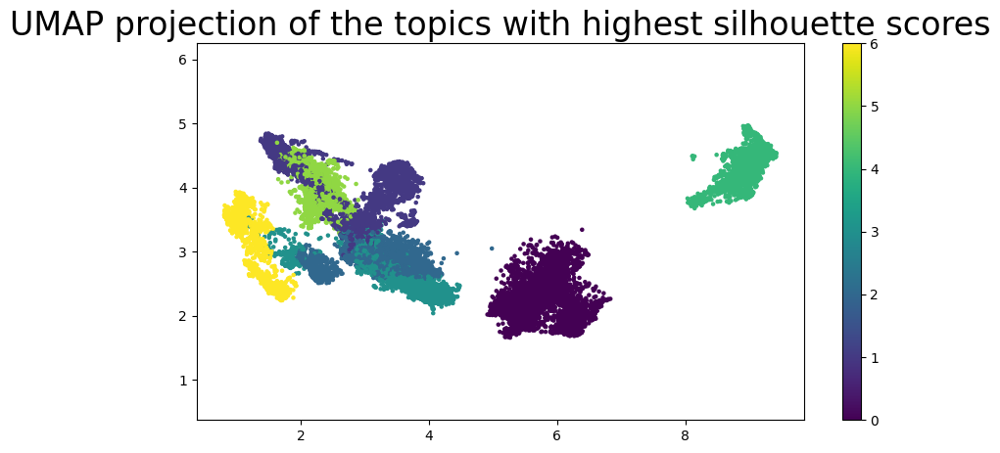

In [8]:
best_indices = np.argsort(silhouette_scores)[-10:]
best_umap_embeddings = umap_embeddings[best_indices]
plt.figure(figsize=(10, 5))
plt.scatter(X[:, 1], X[:, 2], c=labels, cmap='viridis', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar()
plt.title('UMAP projection of the topics with highest silhouette scores', fontsize=24)
plt.show()

In [9]:
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 5))
topic_model.update_topics(tc1.corpus, vectorizer_model=vectorizer_model)

In [10]:
topic_model.get_topic_freq()

,Topic,Count
2,-1,33814
0,0,7354
4,1,6265
1,2,4943
5,3,4479
3,4,4072
7,5,2348
6,6,2254


In [11]:
print(topic_model.get_topic_info())
for topic_id in set(topics):
    print(f"Topic {topic_id}:")
    print(topic_model.get_topic(topic_id))

   Topic  Count                                         Name  \
0     -1  33814                      -1_vendor_new_free_help   
1      0   7354                       0_weed_vendor_xanax_mg   
2      1   6265                 1_market_empire_dream_vendor   
3      2   4943                2_vendor_scammer_scam_looking   
4      3   4479                      3_mdma_lsd_looking_good   
5      4   4072  4_review_vendor review_vendor_review vendor   
6      5   2348            5_order_package_shipping_delivery   
7      6   2254                6_card_bitcoin_carding_wallet   

                                      Representation  \
0  [vendor, new, free, help, best, uk, account, u...   
1  [weed, vendor, xanax, mg, cocaine, uk, best, c...   
2  [market, empire, dream, vendor, nightmare, dre...   
3  [vendor, scammer, scam, looking, scamming, exi...   
4  [mdma, lsd, looking, good, shit, whats, guy, s...   
5  [review, vendor review, vendor, review vendor,...   
6  [order, package, shipping, d

In [12]:
topic_model.visualize_topics()

In [13]:
topic_model.visualize_heatmap()

In [14]:
topic_model.visualize_hierarchy()

In [16]:
reduced_embeddings = UMAP(n_neighbors=15, n_components=2, 
                          min_dist=0.0, metric='cosine').fit_transform(tc1.corpus_embeddings)
topic_model.visualize_documents(tc1.corpus, reduced_embeddings=reduced_embeddings, 
                                hide_document_hover=True, hide_annotations=True)

In [17]:
new_topics = topic_model.reduce_outliers(tc1.corpus, topics, threshold=0.1, strategy='c-tf-idf')
topic_model.update_topics(tc1.corpus, topics=new_topics)

2024-06-26 00:21:14,888 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [18]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,32068,-1_anyone_new_vendor_free,"[anyone, new, vendor, free, help, account, ple...","[new vendor fire mdma us us domestic, uk best ..."
1,0,7429,0_weed_xanax_vendor_mg,"[weed, xanax, vendor, mg, cocaine, uk, coke, b...",[xtc mg pill discount lsd mdma ger eu promo de...
2,1,6404,1_market_empire_dream_nightmare,"[market, empire, dream, nightmare, vendor, dre...","[help empire market best, empire market always..."
3,2,5978,2_vendor_scammer_scam_looking,"[vendor, scammer, scam, looking, vendor vendor...",[drugsuk selective scammer order fe risk cross...
4,3,4480,3_mdma_lsd_get_good,"[mdma, lsd, get, good, shit, looking, whats, g...","[holy shit fuck, apollon lsd dmt mda, zion er ..."
5,4,4155,4_review_vendor review_vendor_review vendor,"[review, vendor review, vendor, review vendor,...",[vendor review luxlife lux pure thc distillate...
6,5,2609,5_order_package_shipping_delivery,"[order, package, shipping, delivery, pack, shi...",[ever since order shipped nt received mail wor...
7,6,2406,6_card_bitcoin_carding_wallet,"[card, bitcoin, carding, wallet, credit, btc, ...",[credit score balance hq debit card fullz appl...


In [19]:
topic_model.visualize_documents(tc1.corpus, reduced_embeddings=reduced_embeddings, 
                                hide_document_hover=True, hide_annotations=True)

In [20]:
topic_model.visualize_hierarchy()

In [21]:
topic_model.visualize_topics()

In [22]:
umap_embeddings = topic_model.umap_model.fit_transform(tc1.corpus_embeddings)
indices = [index for index, topic in enumerate(new_topics) if topic != -1]
X=umap_embeddings[np.array(indices)]
labels = [topic for index, topic in enumerate(new_topics) if topic != -1]
silhouette_scores = silhouette_score(X, labels)
print(f"silhouette_score: {silhouette_scores}")
print(f"Davies_bouldin_score: {davies_bouldin_score(X, labels)}")

silhouette_score: 0.5886645317077637
Davies_bouldin_score: 0.6540718240385147


In [23]:
df['name_thread'] = df['name_thread'].str.lower().dropna()
df.drop_duplicates(subset='name_thread', inplace=True)
df.dropna(subset=['name_thread'], inplace=True)
created_on = df['created_on'].tolist()
len(created_on)

65529

In [24]:
topics_over_time = topic_model.topics_over_time(tc1.corpus, created_on, 
                                                global_tuning=True, evolution_tuning=True, nr_bins=300)

25it [00:25,  1.04s/it]


In [131]:
topic_model.visualize_topics_over_time(topics_over_time, topics=[0, 1, 2, 3, 4, 5, 6], width=1250, height=700)

In [158]:
indices = [index for index, topic in enumerate(topics) if topic != -1]
corpus_valid = [tc1.corpus[i] for i in indices]
created_on_valid = [created_on[i] for i in indices]
embeddings_valid = [tc1.corpus_embeddings[i] for i in indices]
topics_valid = [topics[i] for i in indices]
probs_valid = [probs[i] for i in indices]

# Unisci i risultati con le informazioni sui topic
results = pd.DataFrame({
    'Document': corpus_valid,
    'Embedding': embeddings_valid,
    'Topic': topics_valid,
    'Probability': probs_valid
})
results_final = pd.merge(results, topic_model.get_topic_info(), on='Topic')

# Aggiungi le embeddings UMAP al DataFrame results_final
results_final['UMAP_embedding'] = list(X)
print(results_final.shape)
results_final.head()

(33830, 9)


,Document,Embedding,Topic,Probability,Count,Name,Representation,Representative_Docs,UMAP_embedding
0,drugssupply potential exit scam,"[0.034511916, -0.0046993867, -0.020613767, -0....",2,0.835194,6395,2_vendor_scammer_scam_looking,"[vendor, scammer, scam, looking, vendor vendor...","[vendor xtc selective scammer, warning scam al...","[0.39825505, 1.9966363, 6.5130215, 10.321705, ..."
1,karmaking personal store review crosspost,"[-0.043380827, 0.03714014, -0.028550187, 0.010...",4,1.000000,4230,4_review_vendor review_vendor_review vendor,"[review, vendor review, vendor, review vendor,...","[vendor product review, heinekenexpress vendor...","[-0.07015347, 8.904426, 7.5405426, 9.217339, 2..."
2,vendor review thebteam dream market sample gra...,"[0.0419851, 0.0065825256, -0.06525973, -0.0043...",4,0.588088,4230,4_review_vendor review_vendor_review vendor,"[review, vendor review, vendor, review vendor,...","[vendor product review, heinekenexpress vendor...","[0.00010026313, 8.4563875, 7.132244, 9.648071,..."
3,ketamine mdma meth ice heroin coke ship austra...,"[0.025260657, 0.017700816, 0.0477275, -0.03870...",0,0.955069,7793,0_weed_xanax_mg_vendor,"[weed, xanax, mg, vendor, cocaine, uk, best, c...",[best uk weed vendor big bulk discount free sh...,"[-0.025930932, 5.9145336, 6.3106866, 10.26776,..."
4,diazepam vendor,"[0.03550785, -0.009560079, -0.07405612, 0.0275...",2,1.000000,6395,2_vendor_scammer_scam_looking,"[vendor, scammer, scam, looking, vendor vendor...","[vendor xtc selective scammer, warning scam al...","[0.19230145, 3.402927, 6.4148946, 9.966687, 1...."


In [127]:
topic_model.save("topic_model_0.64Sil", serialization='pickle')

2024-06-25 22:26:41,979 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


In [159]:
results_final.to_parquet('ResultsBERTopic/BERTopic_nodefinedcluster_topics_15n_10com_1200cluster_0.64sil_renewout.parquet')

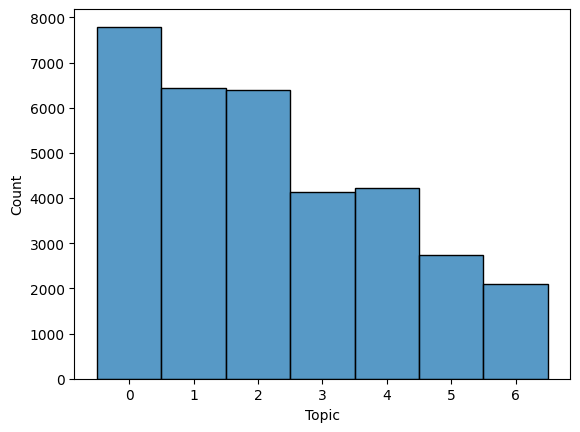

In [160]:
sns.histplot(results_final, x='Topic', discrete=True);

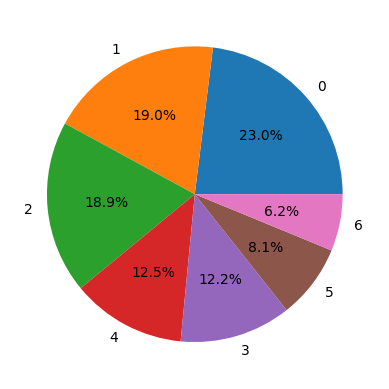

In [161]:
plt.pie(results_final.value_counts('Topic'), labels=results_final.value_counts('Topic').index, autopct='%1.1f%%');

In [ ]:
indices = [index for index, topic in enumerate(new_topics) if topic != -1]
corpus_valid = [tc1.corpus[i] for i in indices]
created_on_valid = [created_on[i] for i in indices]
embeddings_valid = [tc1.corpus_embeddings[i] for i in indices]
topics_valid = [new_topics[i] for i in indices]
probs_valid = [probs[i] for i in indices]

# Unisci i risultati con le informazioni sui topic
results = pd.DataFrame({
    'Document': corpus_valid,
    'Embedding': embeddings_valid,
    'Topic': topics_valid,
    'Probability': probs_valid
})
results_final = pd.merge(results, topic_model.get_topic_info(), on='Topic')

# Aggiungi le embeddings UMAP al DataFrame results_final
results_final['UMAP_embedding'] = list(X)
print(results_final.shape)
results_final.head()

## 500 min cluster size

In [57]:
seed_topic_list = [[
    'tor site', 'drug', 'cocaine', 'ketamine', 'weed', 'trafficking', 'scammer', 'market', 'vendor', 'bitcoin',
    'mdma', 'coke', 'lsd', 'heroine', 'xanax', 'tor node', 'tor site', 'gun', 'weapon', 'hacking'
]]

zeroshot_topic_list = [pd.read_csv('../../../intent_crime.csv')['intent'].tolist()]

representation_model = MaximalMarginalRelevance(diversity=0.3)
vectorizer_model = CountVectorizer(stop_words="english")
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
umap_model = UMAP(n_neighbors=15, n_components=10, min_dist=0.0, metric='cosine', random_state=42)
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=500, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

topic_model = BERTopic(
    language='multilingual',
    top_n_words=10, 
    n_gram_range=(1, 2),
    umap_model=umap_model, 
    hdbscan_model=hdbscan_model, 
    seed_topic_list=seed_topic_list, 
    vectorizer_model=vectorizer_model, 
    ctfidf_model=ctfidf_model, 
    representation_model=representation_model,
    zeroshot_topic_list=zeroshot_topic_list, 
    zeroshot_min_similarity=.05, 
    verbose=True
)

topics, probs = topic_model.fit_transform(tc1.corpus, tc1.corpus_embeddings)

2024-06-26 02:30:05,167 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-06-26 02:32:22,749 - BERTopic - Dimensionality - Completed ✓
2024-06-26 02:32:22,922 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-06-26 02:33:17,746 - BERTopic - Cluster - Completed ✓
2024-06-26 02:33:18,030 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-06-26 02:33:21,458 - BERTopic - Representation - Completed ✓


In [59]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,28000,-1_mdma_new_link_lsd,"[mdma, new, link, lsd, help, free, vendor, nee...","[need high quality fake id check , big thanks ..."
1,0,4930,0_xanax_coke_cocaine_ketamine,"[xanax, coke, cocaine, ketamine, mg, drug, pil...",[promo sale mg adderall ad xanax mg lsd mdma u...
2,1,4469,1_bitcoin_card_bank_carding,"[bitcoin, card, bank, carding, monero, wallet,...","[way cash bank log using btc, send bitcoin get..."
3,2,4227,2_dread_sub_lsd_shit,"[dread, sub, lsd, shit, mdma, whats, guy, fuck...","[hey guy xangod man, let guy know dread host w..."
4,3,3702,3_market_dream_nightmare_dreammarket,"[market, dream, nightmare, dreammarket, market...","[not order nightmare market, nightmare market ..."
5,4,3469,4_review_vendor_reviews_mg,"[review, vendor, reviews, mg, vendymcvendface,...","[thclear ml purple kush vape cart review, vend..."
6,5,3410,5_order_package_pack_dispute,"[order, package, pack, dispute, delivery, ship...","[package custom month love letter nothing, pac..."
7,6,2700,6_vendor_looking_seller_vendors,"[vendor, looking, seller, vendors, buyer, lsd,...","[best vendor uk lsd, looking good vendor cc fu..."
8,7,1694,7_weed_cannabis_marijuana_hash,"[weed, cannabis, marijuana, hash, quality, str...","[hash weed ship eu good vendor also usa, new i..."
9,8,1540,8_darknet_dark_web_sentenced,"[darknet, dark, web, sentenced, drug, darkweb,...",[tacoma man sentenced four year dealing drugs ...


In [60]:
umap_embeddings = topic_model.umap_model.fit_transform(tc1.corpus_embeddings)
indices = [index for index, topic in enumerate(topics) if topic != -1]
X=umap_embeddings[np.array(indices)]
labels = [topic for index, topic in enumerate(topics) if topic != -1]
silhouette_scores = silhouette_score(X, labels)
print(f"silhouette_score: {silhouette_scores}")
print(f"Davies_bouldin_score: {davies_bouldin_score(X, labels)}")

silhouette_score: 0.5718363523483276
Davies_bouldin_score: 0.6211900149809264


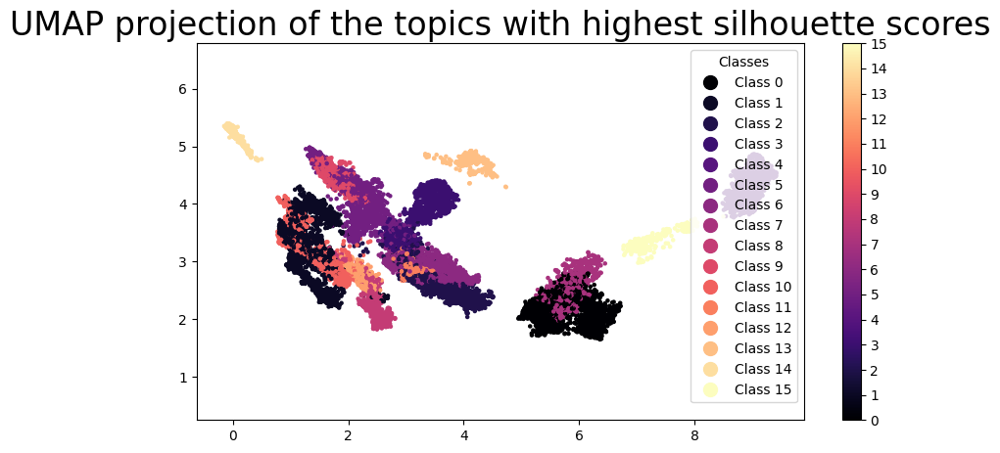

In [61]:
best_indices = np.argsort(silhouette_scores)[-10:]
best_umap_embeddings = umap_embeddings[best_indices]
unique_labels = np.unique(labels)
cmap = plt.cm.magma
plt.figure(figsize=(10, 5))
scatter = plt.scatter(X[:, 1], X[:, 2], c=labels, cmap=cmap, s=5)
plt.gca().set_aspect('equal', 'datalim')
norm = plt.Normalize(vmin=min(labels), vmax=max(labels))
handles = [plt.Line2D([0], [0], marker='o', color=cmap(norm(label)), linestyle='', markersize=10) for label in unique_labels]
legend_labels = [f'Class {label}' for label in unique_labels]
plt.legend(handles, legend_labels, title="Classes")
plt.colorbar(scatter, ticks=range(len(unique_labels)))
plt.title('UMAP projection of the topics with highest silhouette scores', fontsize=24)
plt.show()

In [62]:
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 5))
topic_model.update_topics(tc1.corpus, vectorizer_model=vectorizer_model)

In [63]:
topic_model.visualize_topics()

In [64]:
topic_model.visualize_heatmap()

In [65]:
topic_model.visualize_hierarchy()

In [66]:
reduced_embeddings = UMAP(n_neighbors=15, n_components=2, 
                          min_dist=0.0, metric='cosine').fit_transform(tc1.corpus_embeddings)
topic_model.visualize_documents(tc1.corpus, reduced_embeddings=reduced_embeddings, 
                                hide_document_hover=True, hide_annotations=True)

In [95]:
new_topics = topic_model.reduce_outliers(tc1.corpus, topics, strategy="embeddings", embeddings=tc1.corpus_embeddings, threshold=0.6)
topic_model.update_topics(tc1.corpus, topics=new_topics)

2024-06-26 02:50:37,913 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [96]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,23928,-1_new_vendor_help_uk,"[new, vendor, help, uk, need, mdma, best, free...","[need high quality fake id check , big thanks ..."
1,0,5207,0_xanax_cocaine_mg_coke,"[xanax, cocaine, mg, coke, ketamine, vendor, p...",[promo sale mg adderall ad xanax mg lsd mdma u...
2,1,4512,1_bitcoin_card_bank_carding,"[bitcoin, card, bank, carding, monero, wallet,...","[way cash bank log using btc, send bitcoin get..."
3,2,4944,2_dread_mdma_lsd_get,"[dread, mdma, lsd, get, sub, shit, guy, lookin...","[hey guy xangod man, let guy know dread host w..."
4,3,3801,3_market_dream_nightmare_dream market,"[market, dream, nightmare, dream market, vendo...","[not order nightmare market, nightmare market ..."
5,4,3706,4_review_vendor review_vendor_review vendor,"[review, vendor review, vendor, review vendor,...","[thclear ml purple kush vape cart review, vend..."
6,5,3434,5_order_dispute_pack_package,"[order, dispute, pack, package, shipping, deli...","[package custom month love letter nothing, pac..."
7,6,4123,6_vendor_vendor vendor_looking_best,"[vendor, vendor vendor, looking, best, inquiry...","[best vendor uk lsd, looking good vendor cc fu..."
8,7,1848,7_weed_cannabis_uk_weed vendor,"[weed, cannabis, uk, weed vendor, vendor, qual...","[hash weed ship eu good vendor also usa, new i..."
9,8,1557,8_darknet_dark_dark web_web,"[darknet, dark, dark web, web, drug, sentenced...",[tacoma man sentenced four year dealing drugs ...


In [97]:
topic_model.visualize_documents(tc1.corpus, reduced_embeddings=reduced_embeddings, 
                                hide_document_hover=True, hide_annotations=True)

In [98]:
topic_model.visualize_topics()

In [106]:
topic_model.visualize_hierarchy()

In [99]:
umap_embeddings = topic_model.umap_model.fit_transform(tc1.corpus_embeddings)
indices = [index for index, topic in enumerate(new_topics) if topic != -1]
X=umap_embeddings[np.array(indices)]
labels = [topic for index, topic in enumerate(new_topics) if topic != -1]
silhouette_scores = silhouette_score(X, labels)
print(f"silhouette_score: {silhouette_scores}")
print(f"Davies_bouldin_score: {davies_bouldin_score(X, labels)}")

silhouette_score: 0.49986162781715393
Davies_bouldin_score: 0.7193546666619981


In [100]:
indices = [index for index, topic in enumerate(new_topics) if topic != -1]
corpus_valid = [tc1.corpus[i] for i in indices]
created_on_valid = [created_on[i] for i in indices]
embeddings_valid = [tc1.corpus_embeddings[i] for i in indices]
topics_valid = [new_topics[i] for i in indices]
probs_valid = [probs[i] for i in indices]

# Unisci i risultati con le informazioni sui topic
results = pd.DataFrame({
    'Document': corpus_valid,
    'Embedding': embeddings_valid,
    'Topic': topics_valid,
    'Probability': probs_valid,
    'Created_on': created_on_valid,
})
results_final = pd.merge(results, topic_model.get_topic_info(), on='Topic')

# Aggiungi le embeddings UMAP al DataFrame results_final
results_final['UMAP_embedding'] = list(X)
print(results_final.shape)
results_final.head()
results_final.to_parquet('ResultsBERTopic/BERTopic_nodefinedcluster_topics_15n_10com_500cluster_0.54sil_renewout.parquet')

(41601, 10)


In [105]:
topics_over_time = topic_model.topics_over_time(tc1.corpus, created_on, 
                                                global_tuning=True, evolution_tuning=True, nr_bins=100)
topic_model.visualize_topics_over_time(topics_over_time, width=1250, height=700)

15it [00:20,  1.38s/it]


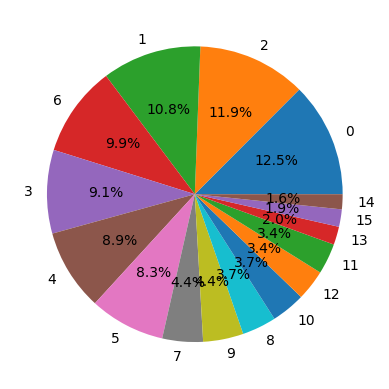

In [107]:
plt.pie(results_final.value_counts('Topic'), labels=results_final.value_counts('Topic').index, autopct='%1.1f%%');

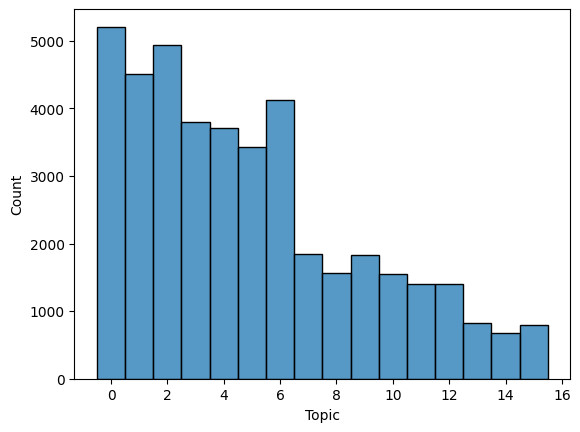

In [108]:
sns.histplot(results_final, x='Topic', discrete=True);

In [109]:
topic_model.save("topic_model_0.50Sil300", serialization='pickle')

2024-06-26 03:10:15,529 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.
